Fig. 6: CellRank predicts a novel de-differentiation trajectory in murine lung regeneration 
----
Applies CellRank to a time-series dataset of lung epithelial cells past bleomycin injury.  

# Preliminaries

## Import packages

In [1]:
# import standard packages
import numpy as np
import pandas as pd 

import matplotlib.pyplot as plt
import seaborn as sns

import os
import sys

# import single-cell packages
import scanpy as sc
import scanpy.external as sce
import scvelo as scv
import cellrank as cr

# set verbosity levels
sc.settings.verbosity = 2
cr.settings.verbosity = 2
scv.settings.verbosity = 3 

## Print package versions for reproducibility

If you want to exactly reproduce the results shown here, please make sure that your package versions match what is printed below. 

In [2]:
cr.logging.print_versions()

cellrank==1.0.0+gb3e00a8 scanpy==1.6.0 anndata==0.7.4 numpy==1.19.2 numba==0.51.2 scipy==1.5.2 pandas==1.1.3 scikit-learn==0.23.2 statsmodels==0.12.0 python-igraph==0.8.3 scvelo==0.2.2 pygam==0.8.0 matplotlib==3.3.2 seaborn==0.11.0


In [3]:
cr.logging.print_version_and_date()

Running CellRank 1.0.0+gb3e00a8, on 2020-10-17 22:20.


## Set up paths

Define the paths to load data, cache results and write figure panels.

In [4]:
sys.path.insert(0, "../..")  # this depends on the notebook depth and must be adapted per notebook

from paths import DATA_DIR, CACHE_DIR, FIG_DIR

Set up the paths to save figures.

In [5]:
scv.settings.figdir = str(FIG_DIR)
sc.settings.figdir = str(FIG_DIR)
cr.settings.figdir = str(FIG_DIR)

## Set up caching

Note: we use a caching extension called `scachepy` for this analysis, see [here](https://github.com/theislab/scachepy). We do this to speed up the runtime of this notebook by avoiding the most expensive computations. Below, we check whether you have scachepy installed and if you don't, then we automatically recompute all results. 

In [6]:
try:
    import scachepy
    c = scachepy.Cache(CACHE_DIR / "lung", separate_dirs=True)
except ImportError:
    c = None
    
use_caching = c is not None
c

Cache(root=/Users/marius/Projects/cellrank_reproducibility/cache/lung, ext='.pickle', compression='None')

## Set global parameters

Set some plotting parameters.

In [7]:
scv.settings.set_figure_params('scvelo', dpi_save=400, dpi=80, transparent=True, fontsize=20, color_map='viridis')
scv.settings.plot_prefix = ""

Set other global parameters

In [8]:
# should figures just be displayed or also saved?
save_figure = True

# should cashed values be used, or recompute?
force_recompute = False

Transition matrix parameters

In [9]:
# set the parameters we want to use to compute the transition matrix
weight_connectivities=0.2
mode="stochastic" 
n_jobs=8
softmax_scale=None

## Define utility functions

Utility funciton to create a set of categorical colors. 

In [10]:
from typing import Optional
from matplotlib import cm as cm
from cellrank.tl._colors import _convert_to_hex_colors

def _create_categorical_colors(n_categories: Optional[int] = None):
    cmaps = [cm.tab10, cm.Pastel1]
    max_cats = sum(c.N for c in cmaps)

    if n_categories is None:
        n_categories = max_cats
    if n_categories > max_cats:
        raise ValueError(
            f"Maximum number of colors ({max_cats}) exceeded: `{n_categories}`."
        )

    colors = []
    for cmap in cmaps:
        colors += [cmap(i) for i in range(cmap.N)][: n_categories - len(colors)]
        if len(colors) == n_categories:
            return _convert_to_hex_colors(colors)

    raise RuntimeError(f"Unable to create `{n_categories}` colors.")

## Load the data

Load the AnnData object from the CellRank software package. 

In [11]:
adata = cr.datasets._lung(DATA_DIR / "lung" / "lung.h5ad")
adata

AnnData object with n_obs × n_vars = 24882 × 24051
    obs: 'initial_size', 'percent_mito', 'identifier', 'name', 'louvain', 'batch', 'day', 'clusters_coarse', 'clusters', 'early_vs_late'
    var: 'velocity_gamma', 'velocity_r2', 'velocity_genes', 'highly_variable'
    uns: 'batch_colors', 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'diffmap_evals', 'early_vs_late_colors', 'louvain_colors', 'neighbors', 'umap'
    obsm: 'X_diffmap', 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

Hard-code a colormap which assigned very distinct colors to the clusters we're going to zoom in on. 

In [12]:
adata.obs['clusters'].cat.reorder_categories(['Basal','Goblet','Club activated', 'MHC-II+ Club','Club','AT1', 'AT2',
                                              'Krt8+ ADI', 'AT2 activated', 'Ciliated activated', 'Ciliated', 
                                               'Neuroendocrine', 'Club to ciliated', 'Mki67+ proliferation'], inplace=True)
n_clusters = len(adata.obs['clusters'].cat.categories)
print(f"There are {n_clusters} clusters here. ")

# assign colors
clusters_colors = _create_categorical_colors(n_clusters)
adata.uns['clusters_colors'] = clusters_colors

There are 14 clusters here. 


## Pre-process the data

Often, we want to process the raw data a bit differently than the data in `.X`.

### Raw data (for plotting)

In [13]:
adata_raw = adata.copy()
sc.pp.filter_genes(adata_raw, min_cells=10)
scv.pp.normalize_per_cell(adata_raw)
sc.pp.log1p(adata_raw)

# annotate highly variable genes, but don't filter them out
sc.pp.highly_variable_genes(adata_raw)
print(f"This detected {np.sum(adata_raw.var['highly_variable'])} highly variable genes. ")
adata.raw = adata_raw

filtered out 7933 genes that are detected in less than 10 cells
Normalized count data: X, spliced, unspliced.
extracting highly variable genes
    finished (0:00:00)
This detected 1899 highly variable genes. 


### Data for velocity computation

In [14]:
# filter, normalise, log transform
scv.pp.filter_and_normalize(adata, min_shared_counts=20, log=True, n_top_genes=2000)

# compute KNN graph and scvelo's moments
sc.pp.neighbors(adata, n_neighbors=30)
scv.pp.moments(adata, n_neighbors=None)

Filtered out 18722 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Exctracted 2000 highly variable genes.
computing neighbors
    using 'X_pca' with n_pcs = 70
    finished (0:00:19)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


# Compute scVelo velocities

## Visualize annotations

saving figure to file /Users/marius/Projects/cellrank_reproducibility/figures/suppl_figures_lung/suppl_fig_annotations/umap_clusters.pdf


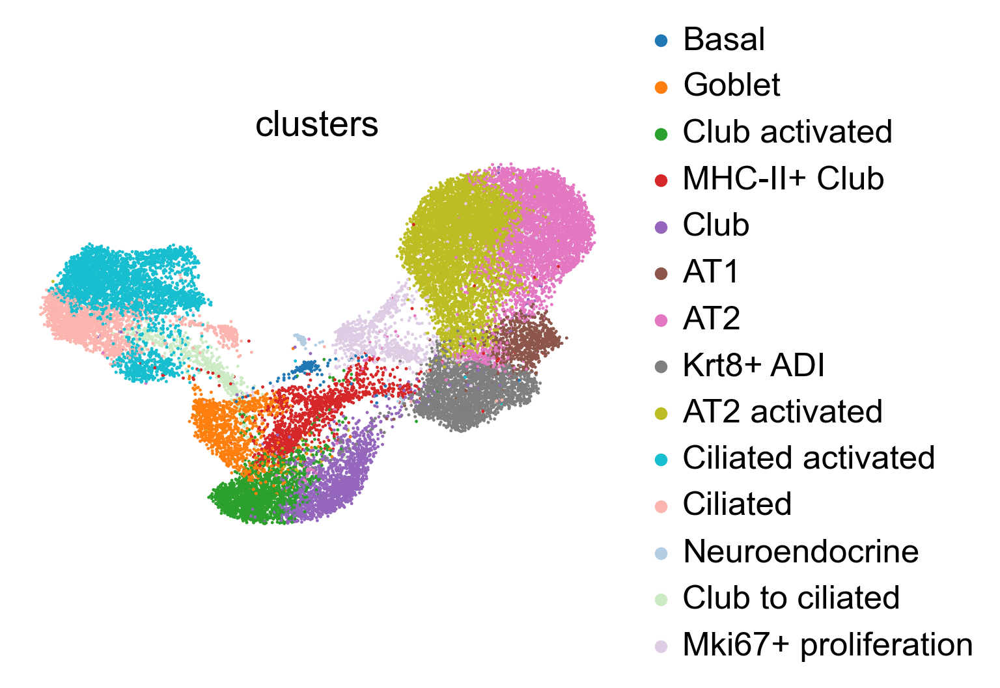

In [15]:
scv.pl.scatter(adata, legend_loc='right', dpi=100, 
               save='suppl_figures_lung/suppl_fig_annotations/umap_clusters.pdf' if save_figure else None)

saving figure to file /Users/marius/Projects/cellrank_reproducibility/figures/suppl_figures_lung/suppl_fig_annotations/umap_day.pdf


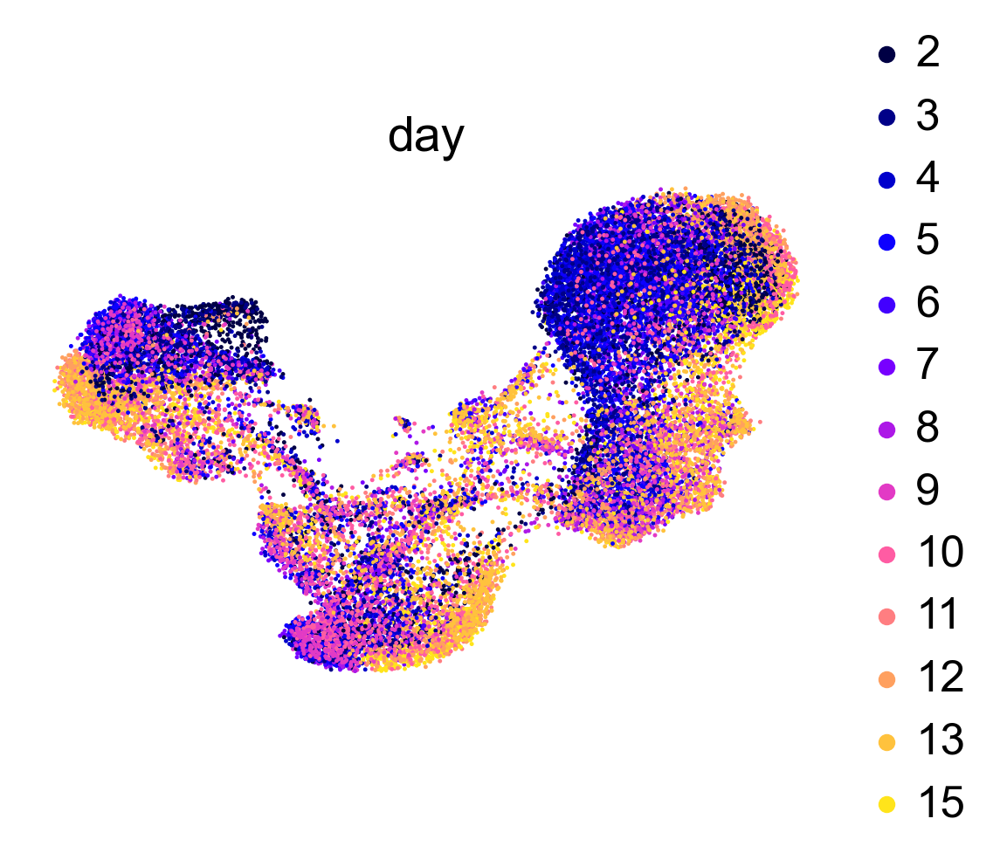

In [16]:
adata.uns['day_colors'] = _convert_to_hex_colors(sns.color_palette("gnuplot2", n_colors=14))
scv.pl.scatter(adata, c='day', legend_loc='right', dpi=100, 
              save='suppl_figures_lung/suppl_fig_annotations/umap_day.pdf' if save_figure else None)

Also look into the distribution of cells by clusters and time points. 

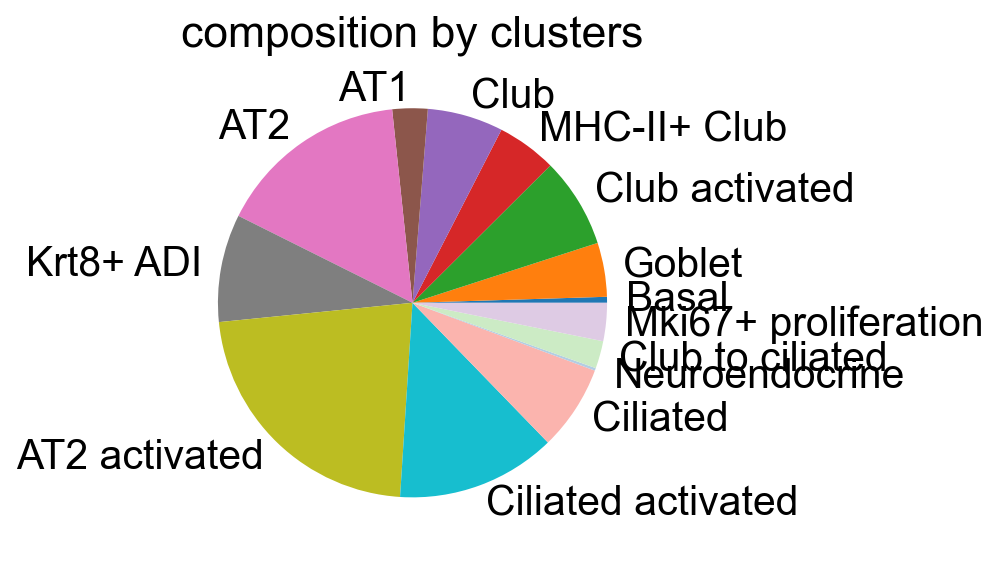

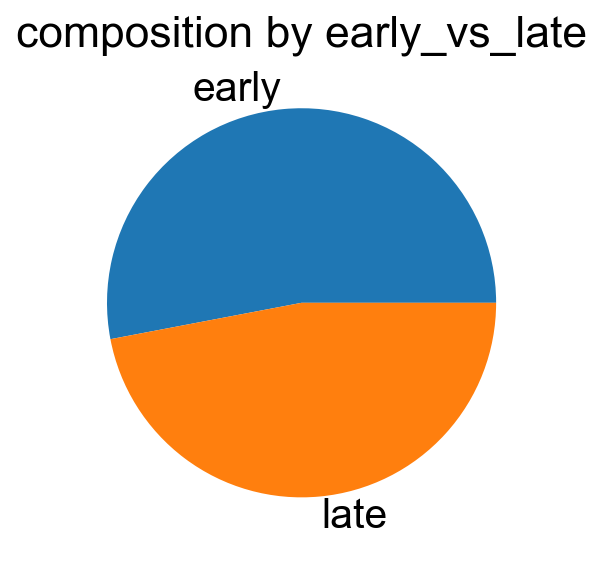

In [17]:
cr.pl._utils.composition(adata, 'clusters')
cr.pl._utils.composition(adata, 'early_vs_late')

Visualise some goblet cell markers

saving figure to file /Users/marius/Projects/cellrank_reproducibility/figures/suppl_figures_lung/suppl_fig_annotations/umap_goblet_markers.pdf


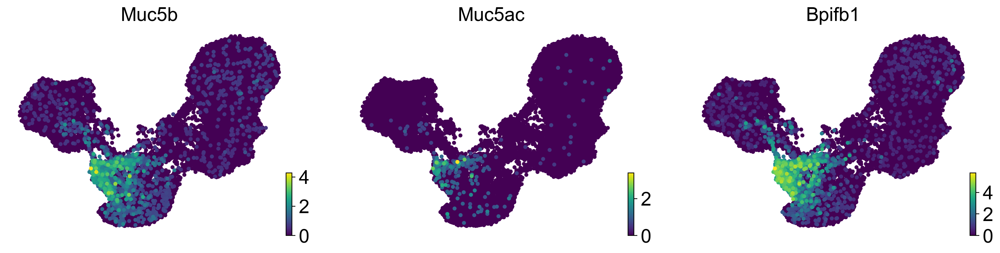

In [18]:
goblet_markers = ['Muc5b', 'Muc5ac', 'Bpifb1']
scv.pl.scatter(adata, legend_loc='right', c=goblet_markers, size=70, dpi=100,
              save='suppl_figures_lung/suppl_fig_annotations/umap_goblet_markers.pdf' if save_figure else None)

## Compute velocities using scVelo

In [19]:
# compute/load from cache the dyn. model params and compute velocities
if use_caching:
    c.tl.recover_dynamics(adata, fname='2020-10-17_recover_dynamics', force=force_recompute)
else:
    scv.tl.recover_dynamics(adata)
    
scv.tl.velocity(adata, mode='dynamical')

Loading data from: `2020-10-17_recover_dynamics.pickle`.
`adata.var` already contains key: `'velocity_gamma'`.
computing velocities
    finished (0:00:14) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


## Project velocities onto the embedding

Compute the velocity graph and use it to project velocities onto the UMAP. 

computing velocity graph
    finished (0:00:16) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:05) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file /Users/marius/Projects/cellrank_reproducibility/figures/fig_6_lung/umap_velocities.pdf


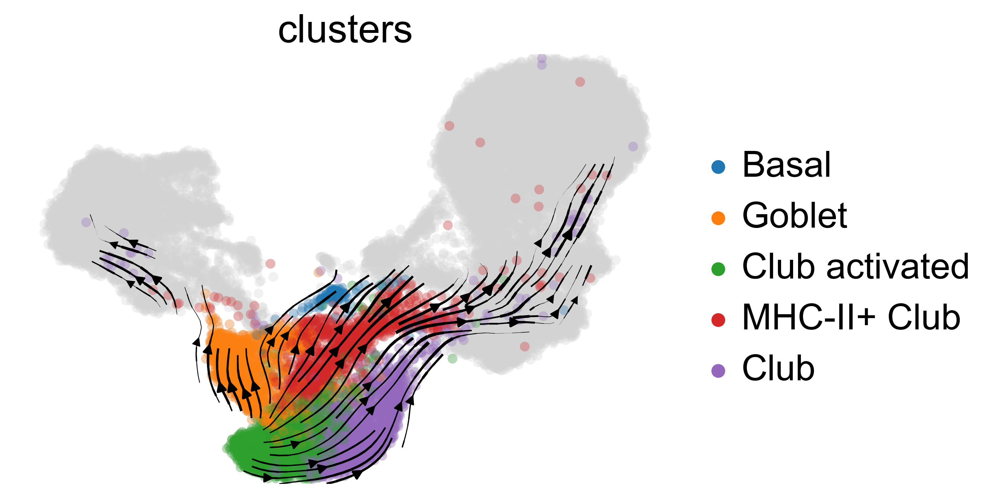

In [20]:
scv.tl.velocity_graph(adata)

airway_subset = ["Basal", "Goblet", "Club activated", "MHC-II+ Club", "Club"]
fig_kwargs = {'color': ['clusters'], 
              'legend_loc': 'right', 
              'dpi': 200,
              'groups': airway_subset}

if save_figure: fig_kwargs['save'] = 'fig_6_lung/umap_velocities.pdf'
scv.pl.velocity_embedding_stream(adata, **fig_kwargs)

# Apply CellRank to all cells

## Initialise kernel and estimator

This serves as an example of how to cach a transition matrix and of the default values we should be using. 

In [21]:
from cellrank.tl.estimators import GPCCA

if use_caching:
    c.tl.transition_matrix(adata, 
                           weight_connectivities=weight_connectivities, 
                           mode=mode, 
                           n_jobs=n_jobs, 
                           softmax_scale=softmax_scale, 
                           fname='2020-10-17_transition_matrix_stochastic', 
                           force=force_recompute)
    g_fwd = GPCCA(adata, obsp_key='T_fwd')
else:
    kernel = cr.tl.transition_matrix(adata, 
                                     weight_connectivities=weight_connectivities, 
                                     mode=mode, 
                                     n_jobs=n_jobs, 
                                     softmax_scale=softmax_scale)
    g_fwd = GPCCA(kernel)
    
print(g_fwd)

Loading data from: `2020-10-17_transition_matrix_stochastic.pickle`.
GPCCA[n=24882, kernel=<Precomputed[origin='array']>]


## Print transition matrix statistics for reproducibility

To make sure that we're using the same transition matrix, show some stats. 

In [22]:
# just for consistency, display some summary staes about the transition matrix
T = adata.obsp['T_fwd']
T_med, T_mean, T_var = np.median(T.data), np.mean(T.data), np.var(T.data)
T_min, T_max = np.min(T.data), np.max(T.data)

print(f'med = {T_med:.6f},\nmean = {T_mean:.6f},\nvar = {T_var:.6f},\nmin = {T_min:.6f},\nmax = {T_max:.6f}')

med = 0.014527,
mean = 0.018998,
var = 0.000272,
min = 0.000002,
max = 0.619356


## Compute the real Schur decomposition

Computing Schur decomposition
Adding `.eigendecomposition`
       `adata.uns['eig_fwd']`
       `.schur`
       `.schur_matrix`
    Finish (0:00:02)


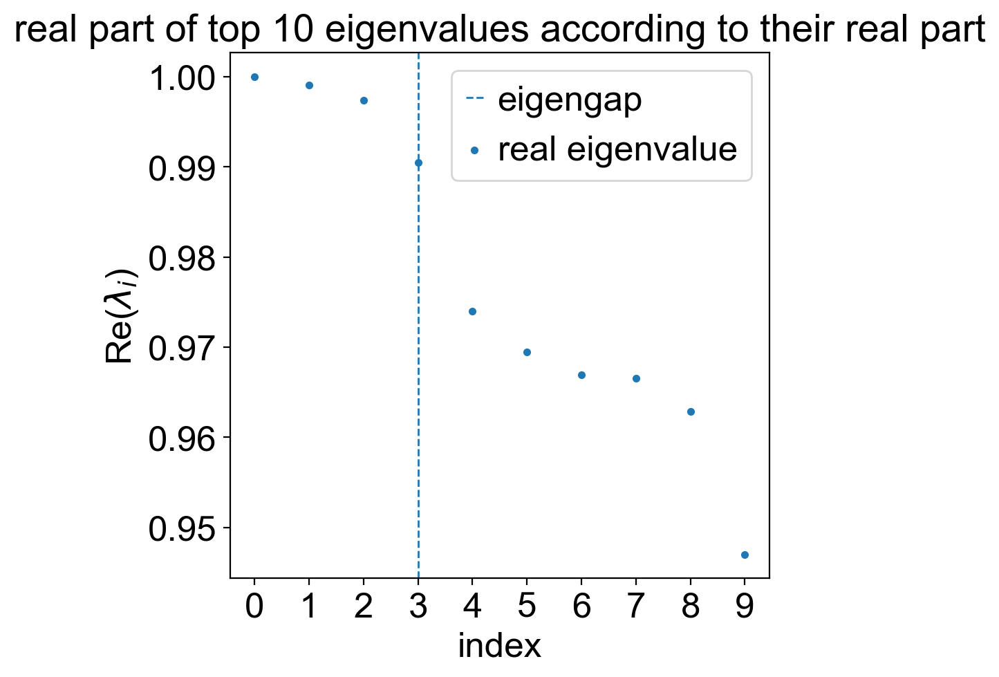

In [23]:
g_fwd.compute_schur()
g_fwd.plot_spectrum(real_only=True)

## Decompose into macrostates

Computing `9` macrostates
INFO: Using pre-computed schur decomposition
Adding `.macrostates_memberships`
       `.macrostates`
       `.schur`
       `.coarse_T`
       `.coarse_stationary_distribution`
    Finish (0:00:11)
saving figure to file /Users/marius/Projects/cellrank_reproducibility/figures/suppl_figures_lung/suppl_fig_club_to_ciliated/umap_macrostates.pdf


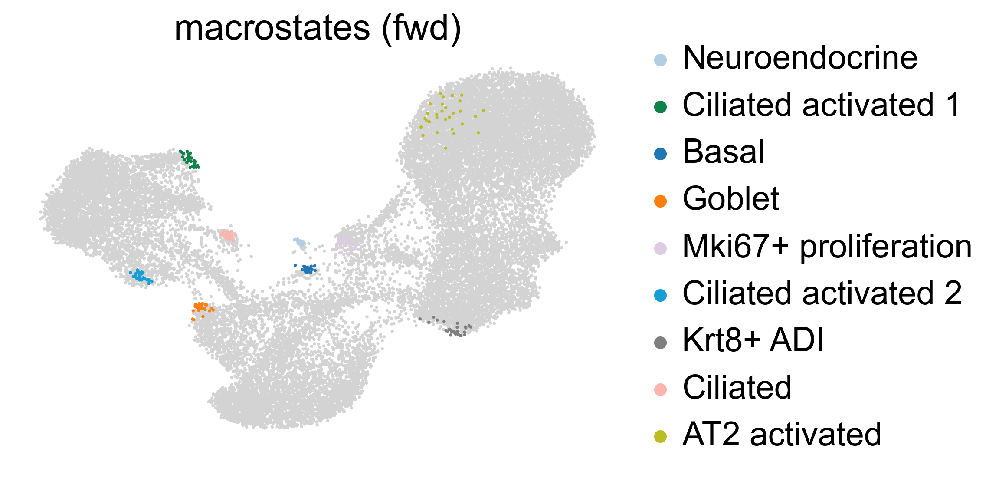

In [24]:
n_states = 9
g_fwd.compute_macrostates(cluster_key='clusters', n_states=n_states, n_cells=30)

g_fwd.plot_macrostates(legend_loc='right', dpi=150, discrete=True, 
                       save='suppl_figures_lung/suppl_fig_club_to_ciliated/umap_macrostates.pdf' if save_figure else None)

Plot the coarse grained transition matrix:

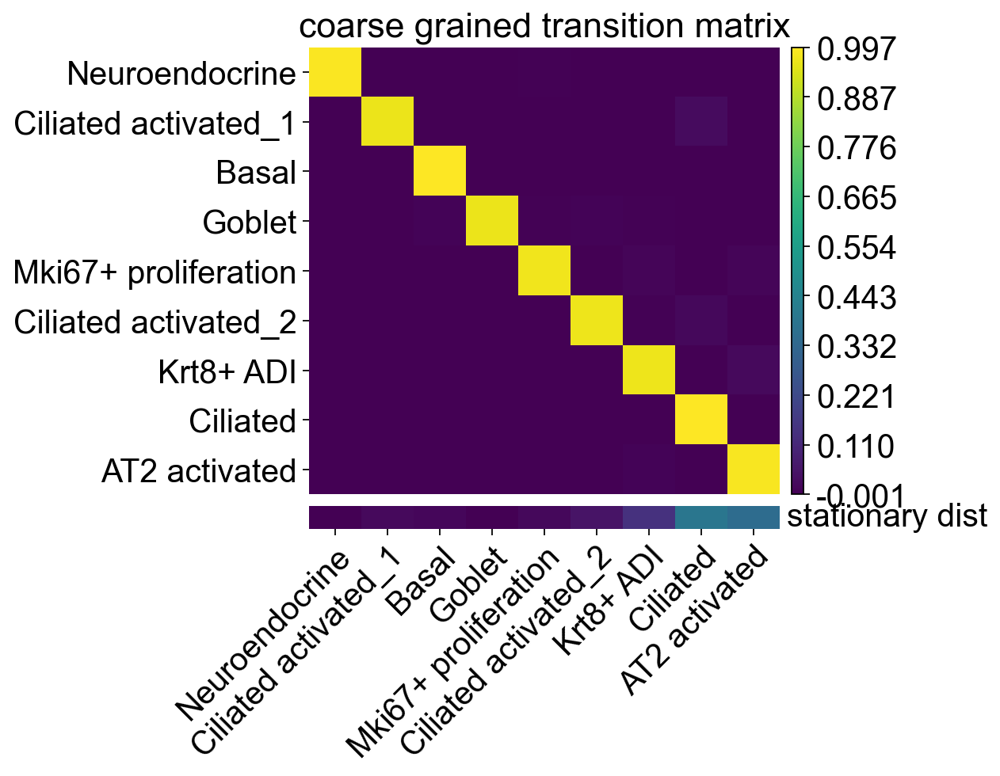

In [25]:
g_fwd.plot_coarse_T(title=f'coarse grained transition matrix', figsize=(5, 5), annotate=False,
                    show_stationary_dist=True)

Adding `adata.obs['terminal_states_probs']`
       `adata.obs['terminal_states']`
       `adata.obsm['macrostates_fwd']`
       `.terminal_states_probabilities`
       `.terminal_states`


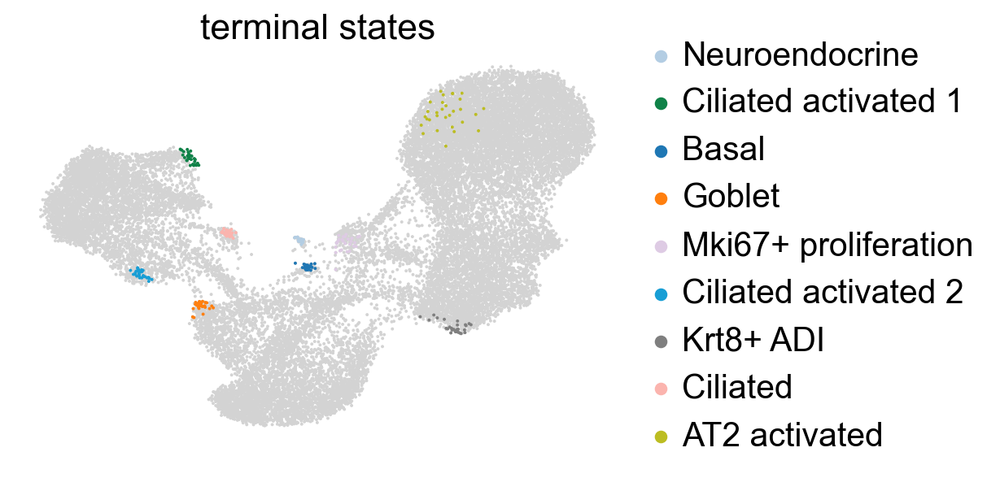

In [26]:
g_fwd.compute_terminal_states()
scv.pl.scatter(adata, c='terminal_states', legend_loc='right')

## Compute fate probabilities

We'll use an iterative solver here since this dataset is a bit larger. With a direct solver, this is still managable and takes around 4-7 min. 

In [27]:
g_fwd.compute_absorption_probabilities(use_petsc=True, solver='gmres', n_jobs=8)

Computing absorption probabilities



Adding `adata.obsm['to_terminal_states']`
       `adata.obs['to_terminal_states_dp']`
       `.absorption_probabilities`
       `.diff_potential`
    Finish (0:00:26)


## Look into club -> ciliated

saving figure to file /Users/marius/Projects/cellrank_reproducibility/figures/suppl_figures_lung/suppl_fig_club_to_ciliated/umap_fate_probs.pdf


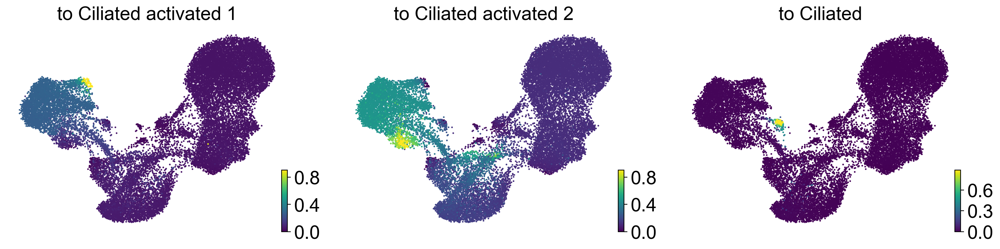

In [28]:
ciliated_macrostates = ['Ciliated activated_1', 'Ciliated activated_2', 'Ciliated']

g_fwd.plot_absorption_probabilities(same_plot=False, dpi=100, lineages=ciliated_macrostates, show_dp=False, 
                                   save='suppl_figures_lung/suppl_fig_club_to_ciliated/umap_fate_probs.pdf')

Join all three ciliated macrostates, look at combined probabilities. 

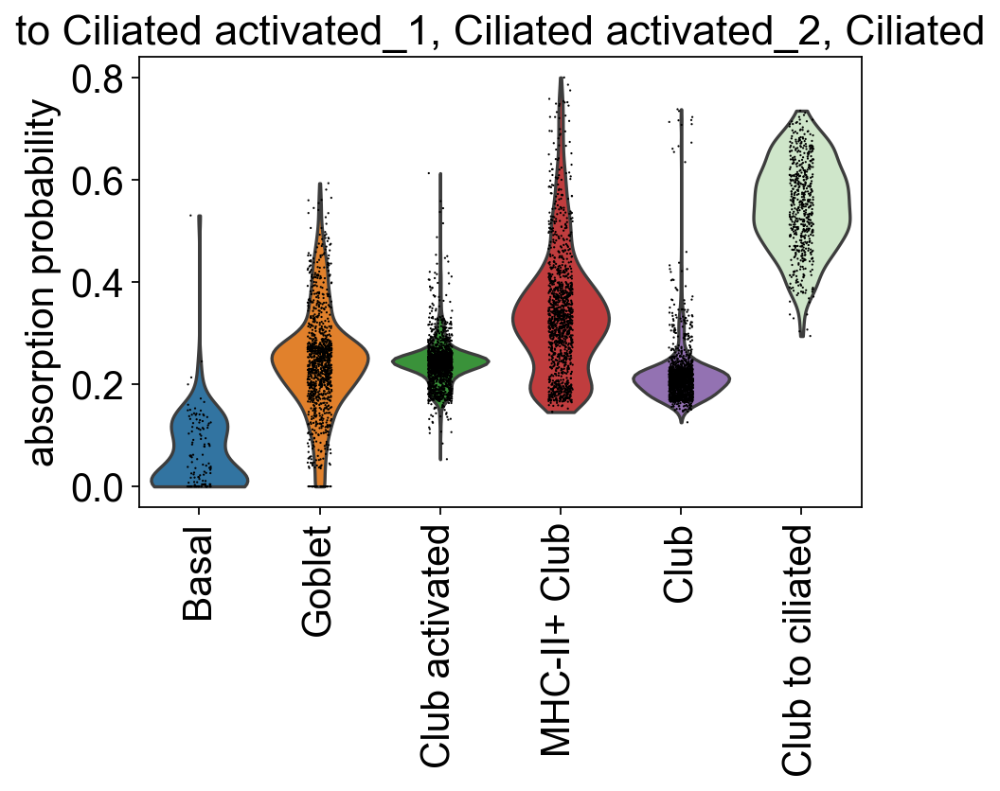

In [29]:
cluster_selection = ['Club', 'Club activated', 'MHC-II+ Club', 'Club to ciliated', 'Goblet', 'Basal']

cr.pl.cluster_fates(adata, mode='violin', clusters=cluster_selection, lineages=", ".join(ciliated_macrostates), 
                   save='suppl_figures_lung/suppl_fig_club_to_ciliated/violin_fate_probs.pdf')

What are the major linege drivers for each of the ciliated states?

In [30]:
ciliated_cluster_selection = ['Ciliated', 'Ciliated activated', 'Club to ciliated', 'Club', 
                              'MHC-II+ Club', 'Club activated']

g_fwd.compute_lineage_drivers(lineages=ciliated_macrostates, 
                              cluster_key='clusters', 
                              clusters=ciliated_cluster_selection,
                              use_raw=True)

Computing correlations for lineages `['Ciliated activated_1', 'Ciliated activated_2', 'Ciliated']` restricted to clusters `['Ciliated', 'Ciliated activated', 'Club to ciliated', 'Club', 'MHC-II+ Club', 'Club activated']` in layer `X` with `use_raw=True`
Adding `.lineage_drivers`
       `adata.raw.var['to Ciliated activated_1']`
       `adata.raw.var['to Ciliated activated_2']`
       `adata.raw.var['to Ciliated']`
    Finish (0:00:02)


Let's look at the highest ranked genes for each ciliated state:

State: to Ciliated


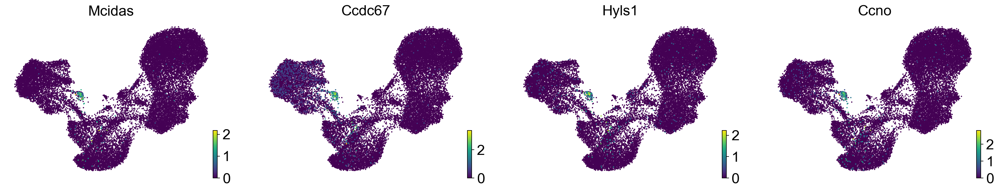

State: to Ciliated activated_1


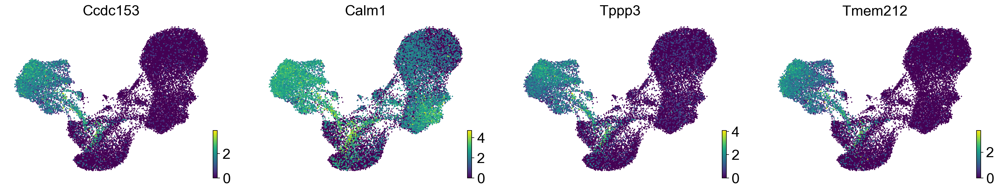

State: to Ciliated activated_2


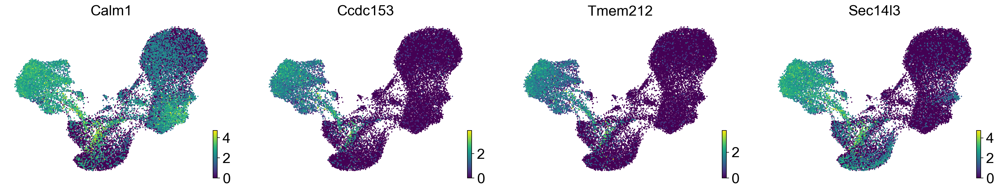

In [31]:
n_genes = 4

for key in [f"to {val}" for val in ['Ciliated', 'Ciliated activated_1', 'Ciliated activated_2']]:
    print(f"State: {key}")
    gene_names = adata.raw.var.sort_values(key, ascending=False).index[:n_genes]
    scv.pl.scatter(adata, c=gene_names)

Gene names
- Mcidas: full name is Multicillin
- Ccdc67: also called Deup1

## Look into goblet -> basal

saving figure to file /Users/marius/Projects/cellrank_reproducibility/figures/suppl_figures_lung/suppl_fig_goblet_to_basal/umap_fate_probs.pdf


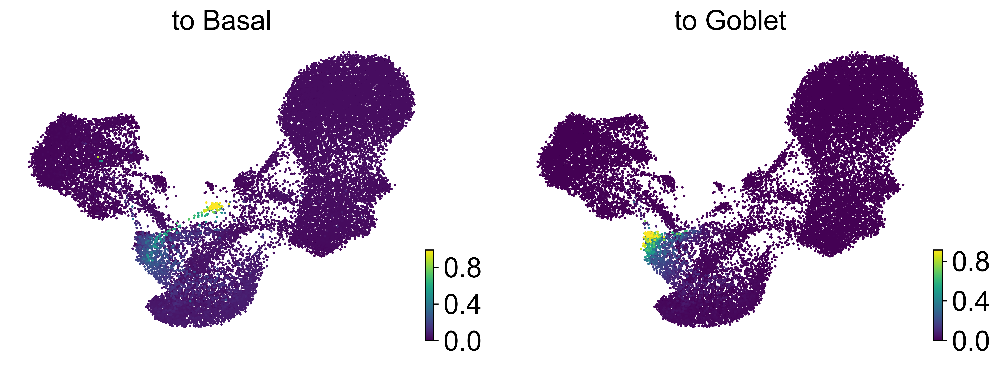

In [32]:
fig_kwargs = {'same_plot': False, 'dpi': 300, 'lineages': ['Basal', 'Goblet'], 'show_dp': False}
if save_figure: fig_kwargs['save'] = 'suppl_figures_lung/suppl_fig_goblet_to_basal/umap_fate_probs.pdf'
g_fwd.plot_absorption_probabilities(**fig_kwargs)

Save these two in the obs annotations

In [33]:
adata.obs['basal_probability'] = adata.obsm['to_terminal_states']['Basal']
adata.obs['goblet_probability'] = adata.obsm['to_terminal_states']['Goblet']

Plot the fates among club cells as a violin plot:

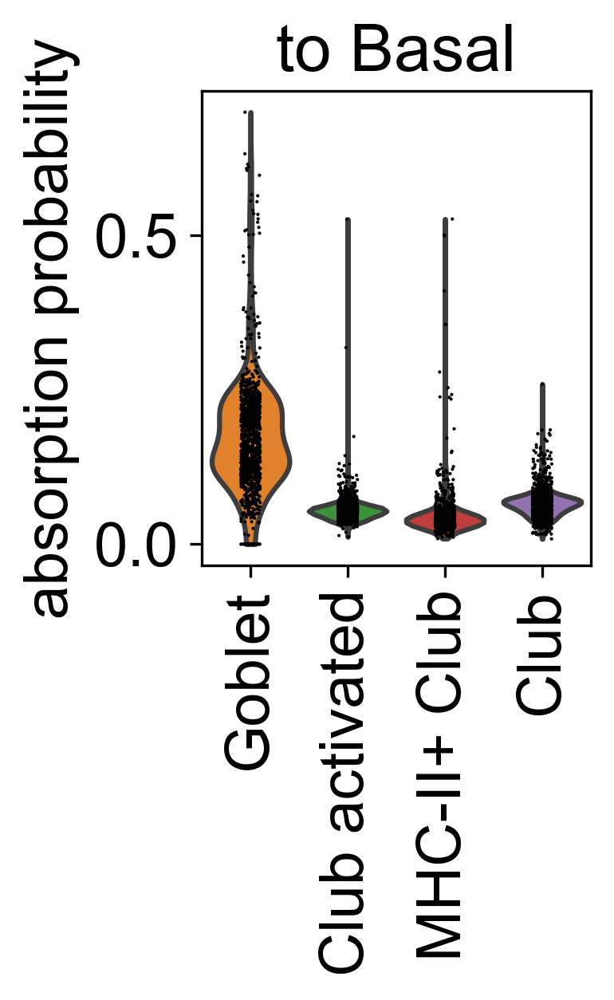

In [34]:
cluster_selection = ['Club', 'Club activated', 'MHC-II+ Club', 'Goblet']

fig_kwargs = {'mode': 'violin', 
                 'cluster_key': 'clusters',
                 'clusters': cluster_selection, 
                 'lineages': ['Basal'], 
                 'figsize': (3, 3), 
                 'dpi': 150}
if save_figure: fig_kwargs['save'] = 'fig_6_lung/violin_basal_fate_probs.pdf'
cr.pl.cluster_fates(adata,  **fig_kwargs)

Perform a statistical test to quantify these results:

In [35]:
from scipy.stats import ttest_ind

fate_probs = g_fwd.absorption_probabilities['Basal']
mask_background = np.in1d(adata.obs['clusters'], ['Club', 'Club activated', 'MHC-II+ Club'])
mask_target = np.in1d(adata.obs['clusters'], ['Goblet'])

background = fate_probs[mask_background]
target = fate_probs[mask_target]
print(f"There are {np.sum(mask_background)} cell in the background and {np.sum(mask_target)} cell in the target.")

ttest_ind(target, background, equal_var=False)

There are 4668 cell in the background and 1116 cell in the target.


Ttest_indResult(statistic=array([42.21536068]), pvalue=array([1.40696962e-236]))

Show a heatmap of goblet -> basal and basal -> goblet probs

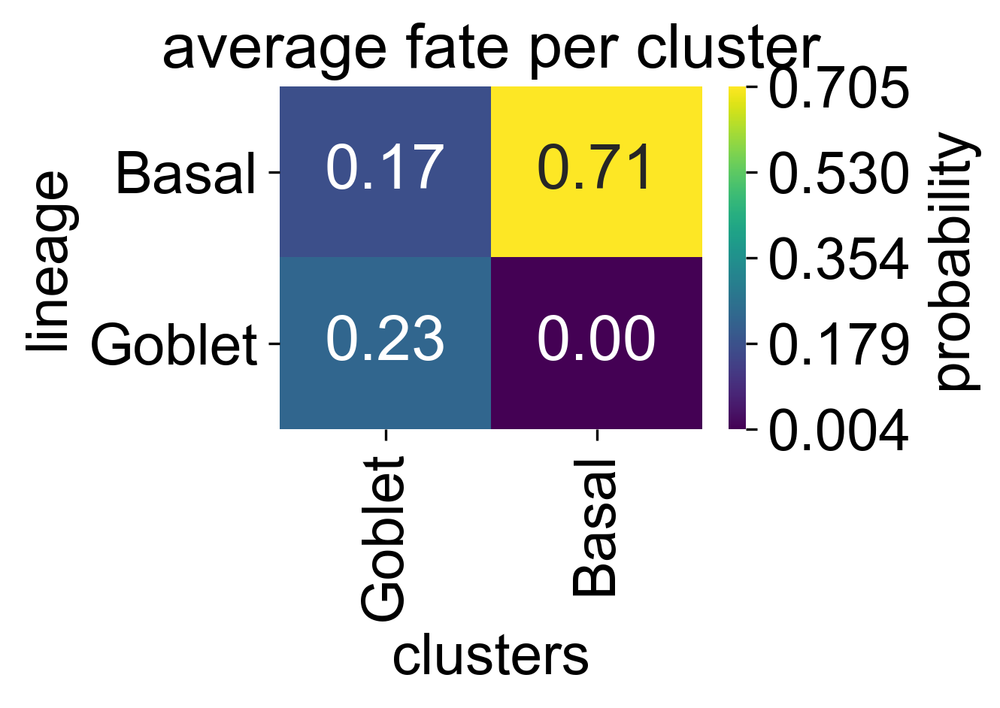

In [36]:
fig_kwargs = {'mode': 'heatmap', 'cluster_key': 'clusters', 'clusters': ['Goblet', 'Basal'], 
                 'lineages': ['Basal', 'Goblet'], 
                 'figsize':(3, 2), 
                 'dpi': 150}
if save_figure: fig_kwargs['save'] = 'suppl_figures_lung/suppl_fig_goblet_to_basal/heatmap_fate_probs.pdf'
cr.pl.cluster_fates(adata, **fig_kwargs)

Copy the fate probabilities over into the raw AnnData object

In [37]:
adata_raw.obsm['to_terminal_states'] = adata.obsm['to_terminal_states'].copy()
adata_raw.uns['terminal_states_colors'] = adata.uns['terminal_states_colors'].copy()
adata_raw.uns['to_terminal_states_colors'] = adata.uns['to_terminal_states_colors'].copy()

adata_raw.obs['basal_probability'] = adata.obs['basal_probability'].copy()
adata_raw.obs['goblet_probability'] = adata.obs['goblet_probability'].copy()

# Apply CellRank to goblet/basal subset

## Subset to goblet & basal cells

In [69]:
selection = ["Goblet", "Basal"]
mask = np.in1d(adata.obs['clusters'], selection)

# restrict both adata and its raw variant
bdata = adata[mask].copy()
bdata_raw = adata_raw[mask].copy()

## Compute diffmap on the subset

Recompute KNN and embeddings

In [70]:
sc.pp.neighbors(bdata, random_state=0)

if 'X_diffmap' in bdata.obsm.keys():
    del bdata.obsm['X_diffmap']
    
if 'diffmap_evals' in bdata.uns.keys():
    del bdata.uns['diffmap_evals']

# load/comptue diffmap
sc.tl.diffmap(bdata)

computing neighbors
    using 'X_pca' with n_pcs = 70
    finished (0:00:00)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9814772  0.9647426  0.93117255 0.92362523 0.90775293
     0.8959037  0.8715536  0.852653   0.8409877  0.83682853 0.8272837
     0.8230472  0.8198391  0.81525403]
    finished (0:00:00)


Look at current probabilities in the diffusion map

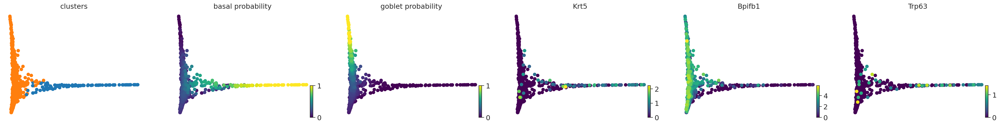

In [71]:
scv.pl.scatter(bdata, color=['clusters', 'basal_probability', 'goblet_probability', 'Krt5', 'Bpifb1', 'Trp63'], 
               basis='diffmap', color_map='viridis', size=200)

Also show a plot with the velocities on the diffmap

In [72]:
scv.pl.velocity_embedding_stream(bdata, 
                                 basis="diffmap", 
                                 color="clusters", 
                                 dpi=150, 
                                 figsize=(4, 3), 
                                 legend_loc='right', 
                                 save="fig_6_lung/diffmap_clusters.pdf" if save_figure else None)

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_diffmap', embedded velocity vectors (adata.obsm)
saving figure to file /Users/marius/Projects/cellrank_reproducibility/figures/fig_6_lung/diffmap_clusters.pdf


## Initialise kernel and estimator

We do this so that we can easily define the starting point of this process as well. 

In [73]:
if use_caching:
    c.tl.transition_matrix(bdata, 
                           weight_connectivities=weight_connectivities, 
                           mode=mode, 
                           n_jobs=n_jobs, 
                           softmax_scale=softmax_scale, 
                           fname='2020-10-17_transition_matrix_stochastic_subset', 
                           force=force_recompute)
    g_red = GPCCA(bdata, obsp_key='T_fwd')
else:
    kernel = cr.tl.transition_matrix(bdata, 
                                     weight_connectivities=weight_connectivities, 
                                     mode=mode, 
                                     n_jobs=n_jobs, 
                                     softmax_scale=softmax_scale)
    g_red = GPCCA(kernel)
    
print(g_red)

Loading data from: `2020-10-17_transition_matrix_stochastic_subset.pickle`.
`adata.obsp` already contains key: `'T_fwd'`.
`adata.uns` already contains key: `'T_fwd_params'`.
GPCCA[n=1239, kernel=<Precomputed[origin='array']>]


## Print transition matrix statistics for reproducibility

To make sure that we're using the same transition matrix, show some stats. 

In [74]:
# just for consistency, display some summary staes about the transition matrix
T = bdata.obsp['T_fwd']
T_med, T_mean, T_var = np.median(T.data), np.mean(T.data), np.var(T.data)
T_min, T_max = np.min(T.data), np.max(T.data)

print(f'med = {T_med:.6f},\nmean = {T_mean:.6f},\nvar = {T_var:.6f},\nmin = {T_min:.6f},\nmax = {T_max:.6f}')

med = 0.031433,
mean = 0.040826,
var = 0.001104,
min = 0.002227,
max = 0.300644


## Compute the real Schur decomposition

Computing Schur decomposition
When computing macrostates, choose a number of states NOT in `[7]`
Adding `.eigendecomposition`
       `adata.uns['eig_fwd']`
       `.schur`
       `.schur_matrix`
    Finish (0:00:00)


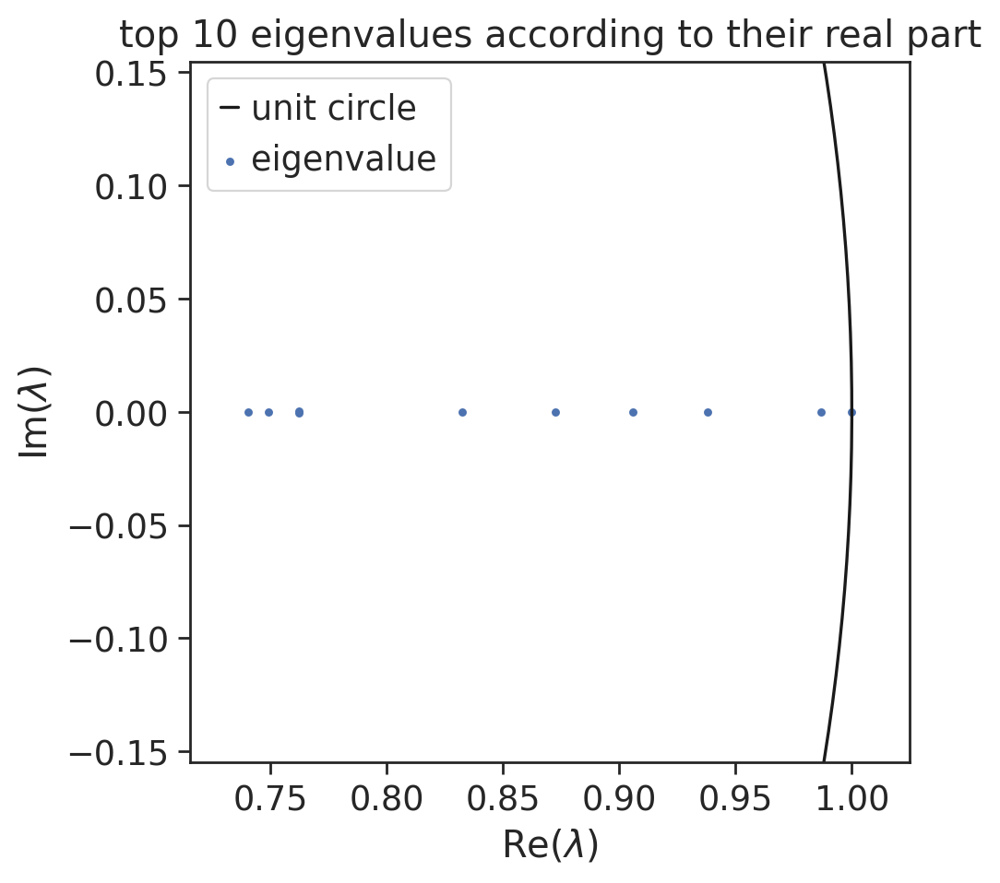

In [75]:
g_red.compute_schur()
g_red.plot_spectrum()

## Decompose into macrostates 

In [76]:
g_red.compute_macrostates(cluster_key='clusters', n_states=3)

fig_kwargs = {'basis': 'diffmap', 'discrete': True, 'legend_loc': 'right'}
if save_figure: fig_kwargs['save'] = 'suppl_figures_lung/suppl_fig_palantir_pseudotime/diffmap_macrostates.pdf'
g_red.plot_macrostates(**fig_kwargs)

Computing `3` macrostates
INFO: Using pre-computed schur decomposition
Adding `.macrostates_memberships`
       `.macrostates`
       `.schur`
       `.coarse_T`
       `.coarse_stationary_distribution`
    Finish (0:00:00)
saving figure to file /Users/marius/Projects/cellrank_reproducibility/figures/suppl_figures_lung/suppl_fig_palantir_pseudotime/diffmap_macrostates.pdf


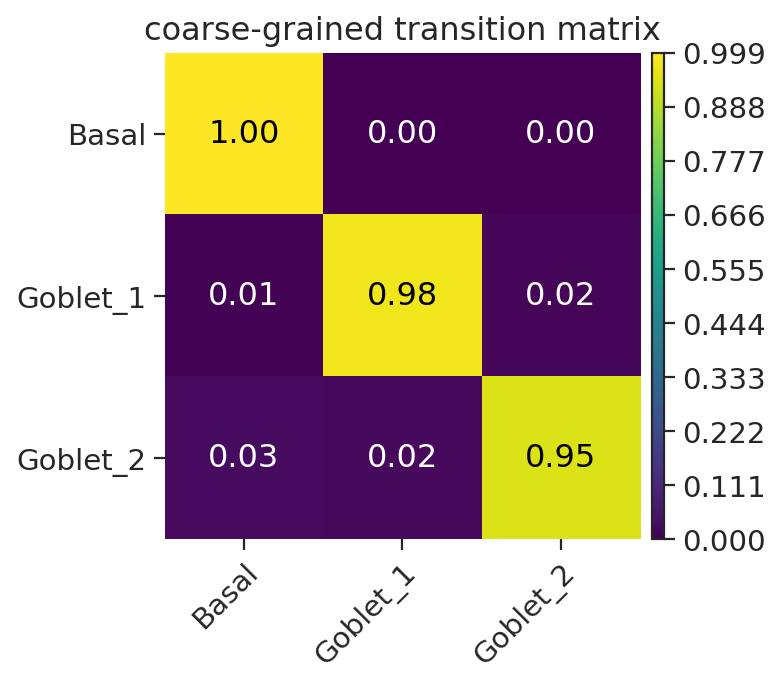

In [77]:
fig_kwargs = {'show_stationary_dist': False, 'figsize': (4, 4), 'annotate': True}
if save_figure: fig_kwargs['save'] = 'suppl_figures_lung/suppl_fig_palantir_pseudotime/heatmap_t_coarse.pdf'
g_red.plot_coarse_T(**fig_kwargs)

## Automatically identify initial and terminal states

Based on this, automatically determine the initial & terminal states:

In [78]:
g_red.compute_terminal_states()
g_red._compute_initial_states()

fig_kwargs = {'color': 'initial_states_probs', 'basis': 'diffmap', 'legend_loc': 'right', 
              'color_map': 'viridis'}
if save_figure: fig_kwargs['save'] = 'suppl_figures_lung/suppl_fig_palantir_pseudotime/diffmap_initial.pdf'
scv.pl.scatter(bdata, **fig_kwargs)

Adding `adata.obs['terminal_states_probs']`
       `adata.obs['terminal_states']`
       `adata.obsm['macrostates_fwd']`
       `.terminal_states_probabilities`
       `.terminal_states`
Adding `adata.obs['initial_states_probs']`
       `adata.obs['initial_states']`

saving figure to file /Users/marius/Projects/cellrank_reproducibility/figures/suppl_figures_lung/suppl_fig_palantir_pseudotime/diffmap_initial.pdf


## Compute fate probabilities

Comptue absorption probabilities towards the temrinal states

Computing absorption probabilities
Adding `adata.obsm['to_terminal_states']`
       `adata.obs['to_terminal_states_dp']`
       `.absorption_probabilities`
       `.diff_potential`
    Finish (0:00:00)


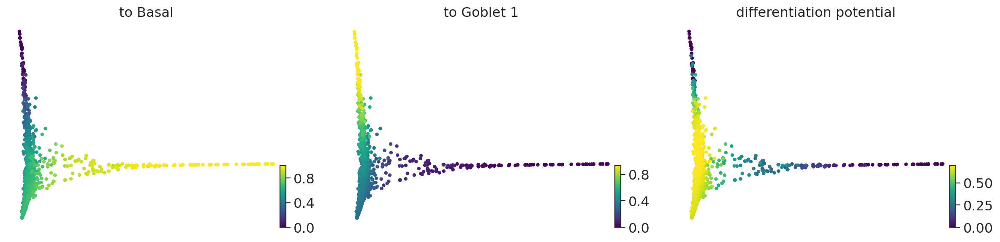

In [79]:
g_red.compute_absorption_probabilities()
g_red.plot_absorption_probabilities(basis='diffmap', same_plot=False, show_dp=True)

## Run Palantir and MAGIC

In [80]:
import palantir

Print the palantir version

In [81]:
print(f"palantir=={palantir.__version__}")

palantir==1.0.0


Prepare the data, compute diffusion maps, multiscale data and actually run palantir

In [82]:
# compute diffusion map
n_comps = 300
dm_res = palantir.utils.run_diffusion_maps(pd.DataFrame(bdata.obsm['X_pca'][:, :n_comps], index=bdata.obs_names))

# comptue multiscale space in diffusion map space
ms_data = palantir.utils.determine_multiscale_space(dm_res)

# run MAGIC imputation
imp_df = palantir.utils.run_magic_imputation(bdata, dm_res)

Determing nearest neighbor graph...
computing neighbors
    finished (0:00:00)


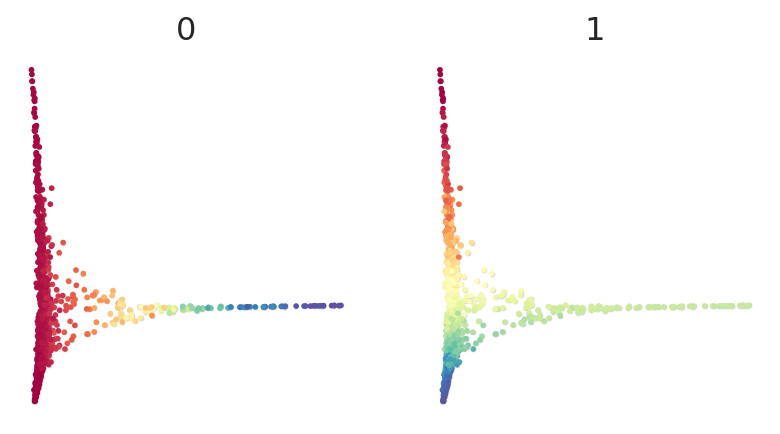

In [83]:
# look at these multiscale components
diffmap = pd.DataFrame(bdata.obsm['X_diffmap'][:, 1:3], index=bdata.obs_names, columns=['x', 'y'])

palantir.plot.plot_gene_expression(ms_data, diffmap, ms_data.columns)

Use CellRank to assign initial and terminal cells automatically. 

(<Figure size 320x320 with 1 Axes>, <AxesSubplot:>)

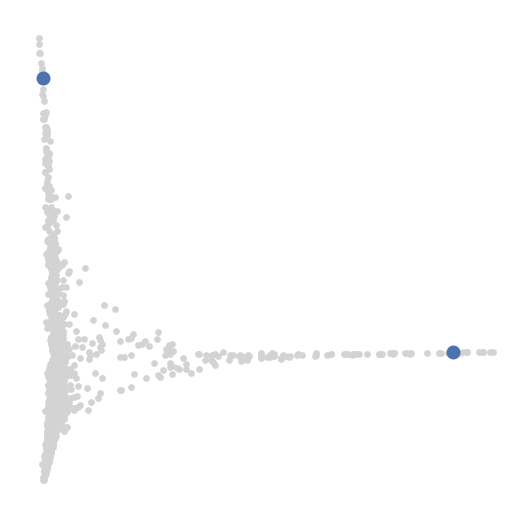

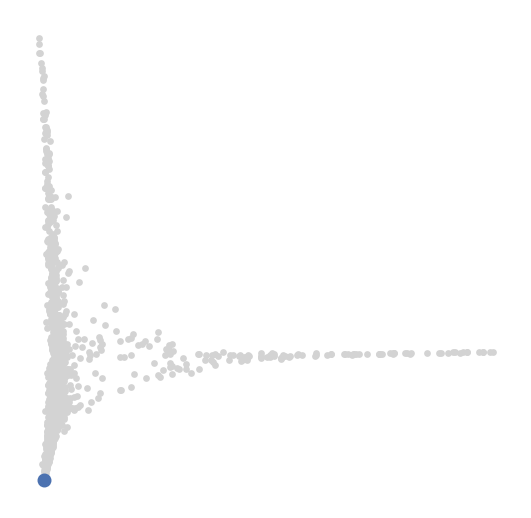

In [84]:
terminal_cells = {'Goblet': bdata[np.where(bdata.obs['terminal_states_probs'] == 1)[0]].obs_names[0],
               'Basal': bdata[np.where(bdata.obs['terminal_states_probs'] == 1)[0]].obs_names[1]
               }
initial_cell = bdata[bdata.obs['initial_states_probs'].argmax()].obs_names[0]

# show these initial and temrinal cells in an embedding
palantir.plot.highlight_cells_on_tsne(diffmap, terminal_cells.values())
palantir.plot.highlight_cells_on_tsne(diffmap, initial_cell)

Actually run Palantir

In [85]:
import random
random.seed = 0
np.random.seed(0)

pr_res = palantir.core.run_palantir(ms_data, 
                                    initial_cell, 
                                    terminal_states=terminal_cells.values(),
                                    knn=30, 
                                    num_waypoints=1200, 
                                    n_jobs=-1,
                                    scale_components=False, 
                                    use_early_cell_as_start=True)

# Give the branches nice names
terminal_cells_inverse = {value: key for key, value in terminal_cells.items()}
pr_res.branch_probs.columns = [terminal_cells_inverse[key] for key in pr_res.branch_probs.columns]
pr_res.branch_probs.head()

# save both pseudotime and imputed data in bdata
bdata.obs['palantir_pseudotime'] = pr_res.pseudotime.copy()
bdata.layers['magic_imputed_data'] = imp_df.values

Sampling and flocking waypoints...
Time for determining waypoints: 0.004452065626780192 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.021839797496795654 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


In [86]:
fig_kwargs = {'color': 'palantir_pseudotime', 
              'color_map': 'viridis', 
              'dpi': 150, 
              'basis': 'diffmap'}
if save_figure: fig_kwargs['save'] = 'suppl_figures_lung/suppl_fig_palantir_pseudotime/diffmap_pseudotime.pdf'
scv.pl.scatter(bdata, **fig_kwargs)

saving figure to file /Users/marius/Projects/cellrank_reproducibility/figures/suppl_figures_lung/suppl_fig_palantir_pseudotime/diffmap_pseudotime.pdf


## Chart the stages of dedifferentiation

Define thresholds for the three stages of de-differentiation using pseudotime and CellRank's basal probability. First, decide which pseudotime to use:

In [87]:
pseudotime = 'palantir_pseudotime'
data_key = 'magic_imputed_data'
n_knots = 10
weight_threshold = (0, 0)

<AxesSubplot:xlabel='basal_probability', ylabel='Density'>

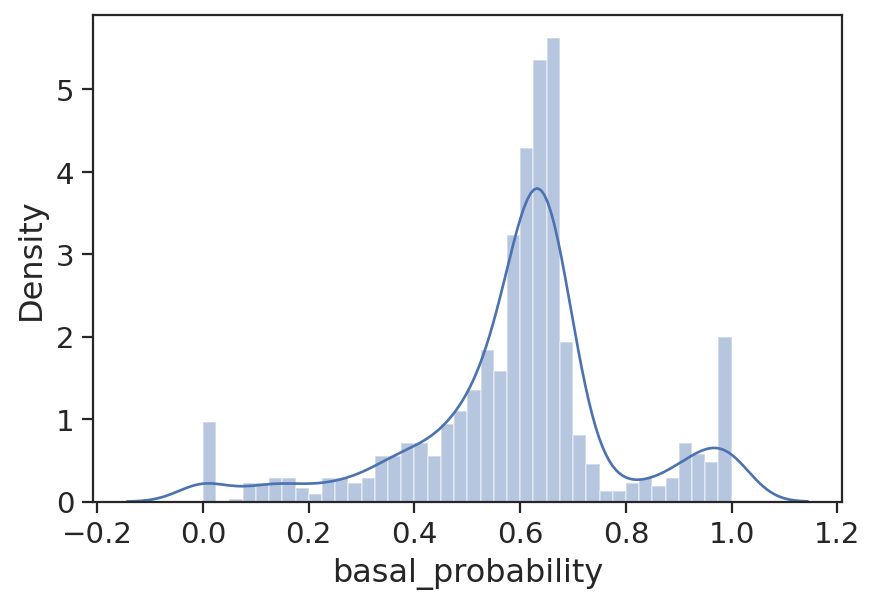

In [88]:
# get the updated basal and goblet probabilities
bdata.obs['basal_probability'] = bdata.obsm['to_terminal_states']['Basal']
bdata.obs['goblet_probability'] = bdata.obsm['to_terminal_states']['Goblet_1']

sns.distplot(bdata.obs['basal_probability'])

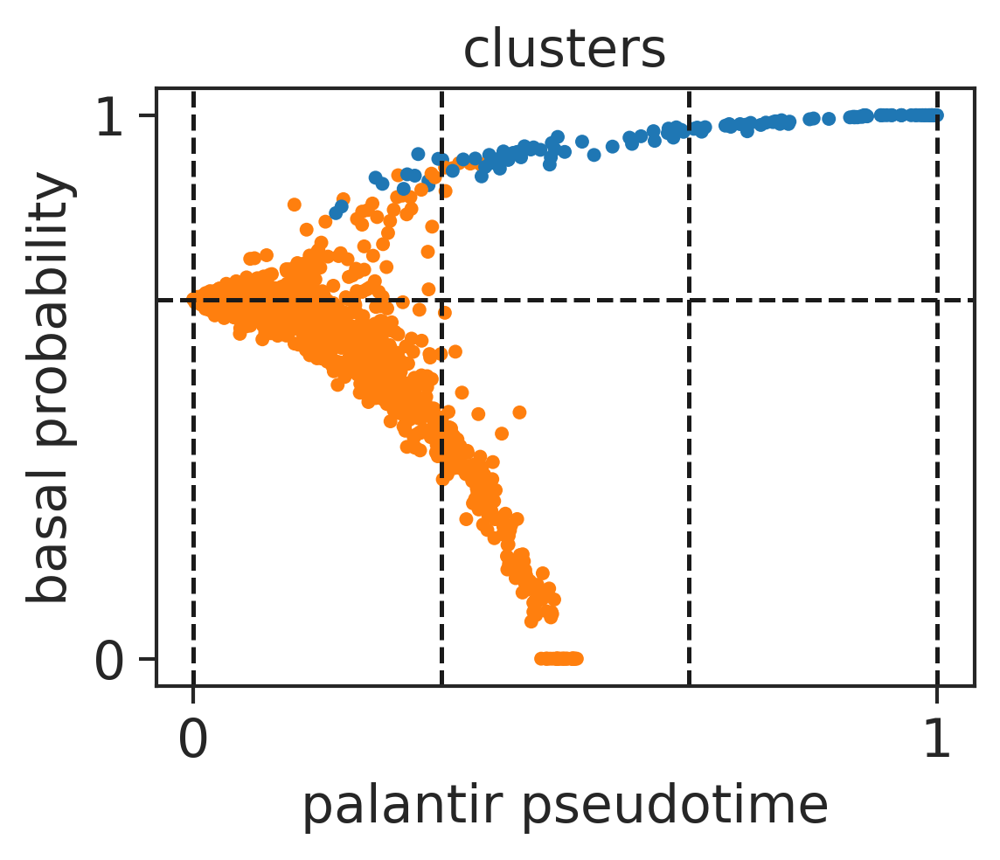

In [89]:
# divide the x-axis in three equal sized bins
basal_min, l1, l2 = 0.66, 1/3, 2/3 

fig = plt.figure(None, (4, 3), dpi=150)
ax = fig.add_subplot(111)

ax = scv.pl.scatter(bdata, x=pseudotime, y="basal_probability", show=False, ax=ax)
ax.axhline(y=basal_min, ls='--', c="k")
ax.axvline(x=0, ls='--', c="k")
ax.axvline(x=l1, ls='--', c="k")
ax.axvline(x=l2, ls='--', c="k")
ax.axvline(x=1, ls='--', c="k")

if save_figure:
    plt.savefig(FIG_DIR / "fig_6_lung" / "stages_of_dediff.pdf", bbox_inches='tight')

Use these thresholds to actually define the three stages

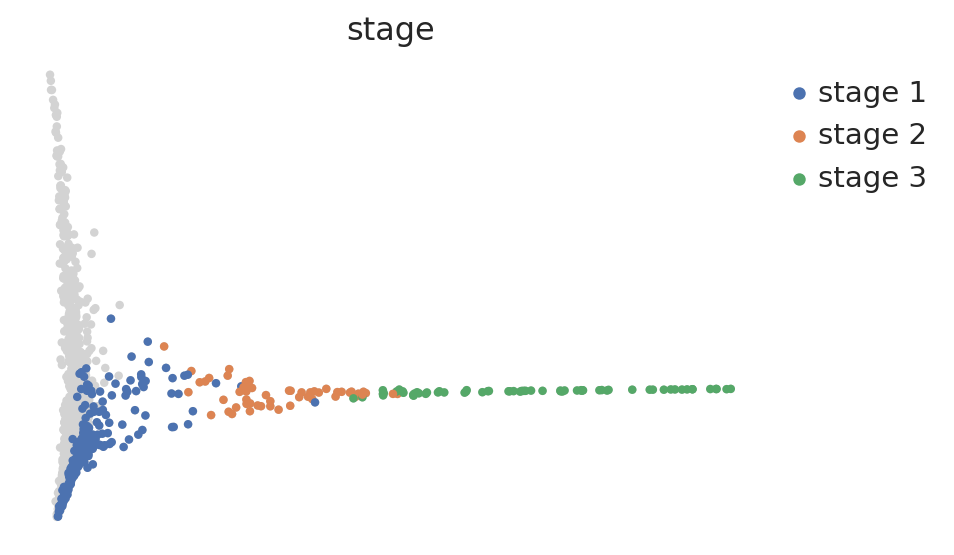

In [90]:
# define the three stages
mask_1 = bdata.obs['basal_probability'] >= basal_min
mask_2 = bdata.obs[pseudotime] <= l1
mask_stage_1 = np.logical_and(mask_1, mask_2)

mask_1 = bdata.obs['basal_probability'] >= basal_min
mask_2 = bdata.obs[pseudotime] > l1
mask_3 = bdata.obs[pseudotime] <= l2
mask_4 = np.logical_and(mask_1, mask_2)
mask_stage_2 = np.logical_and(mask_4, mask_3)

mask_1 = bdata.obs['basal_probability'] >= basal_min
mask_2 = bdata.obs[pseudotime] >= l2
mask_stage_3 = np.logical_and(mask_1, mask_2)

# Use the masks to define a categorical annotation of the three stages
stage = pd.Series(index=bdata.obs_names)
stage[mask_stage_1] = "stage 1"
stage[mask_stage_2] = "stage 2"
stage[mask_stage_3] = "stage 3"
stage = stage.astype("category")
bdata.obs['stage'] = stage

# plot the categorical annotation
scv.pl.scatter(bdata, c='stage', basis='diffmap')

## Characerise the three stages

Get a dataframe for plottign as a boxplot

<AxesSubplot:xlabel='stage', ylabel='gene expression'>

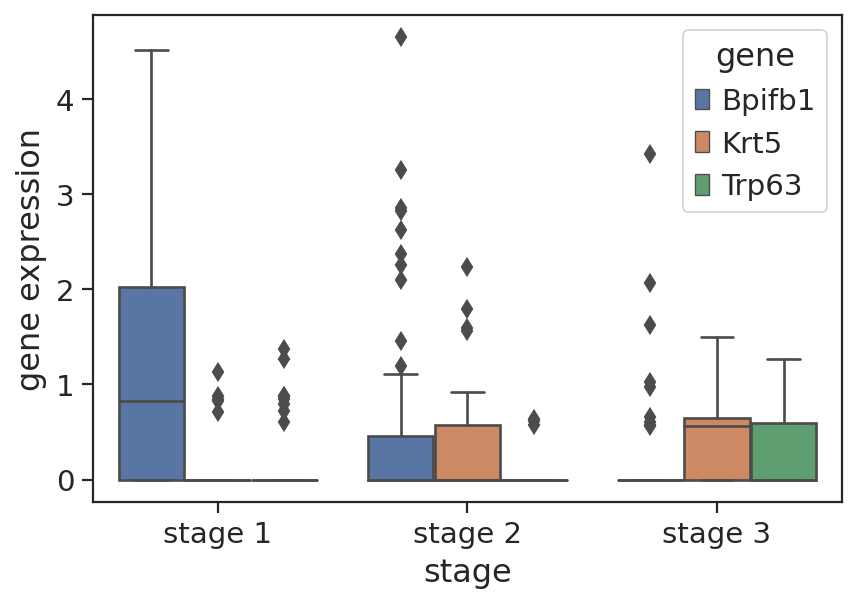

In [91]:
plotting_df = sc.get.obs_df(bdata, keys=["stage"])
for gene in ['Bpifb1', 'Krt5', 'Trp63']:
    plotting_df[gene] = bdata.raw[:, gene].X.A.flatten()

plotting_df = plotting_df.melt(id_vars="stage", value_name="gene expression", var_name="gene")

sns.boxplot(x="stage", y="gene expression", hue="gene", data=plotting_df)

Same thing in a dotplot:

In [92]:
sc.settings.figdir = FIG_DIR / "fig_6_lung"
sc.pl.dotplot(bdata, var_names=['Bpifb1', 'Krt5', 'Trp63'], groupby="stage", 
             save='stages.pdf' if save_figure else None)